In [1]:
import os
import config
from geopy.geocoders import GoogleV3, Nominatim
import geopandas as gpd
from busSim import BusSim
from shapely.geometry import Point

In [2]:
DATA_PATH = "./data"
DAY = "monday"
START_TIME = "12:00:00"
ELAPSE_TIME = "00:30:00"
AVG_WALKING_SPEED = 1.4 # 1.4 meters per second
MAX_WALKING_MIN = 10
city = gpd.read_file("./data/plot/background/madison-shp")
lakes = gpd.read_file("./data/plot/background/water-shp")
street = gpd.read_file("./data/plot/background/street-shp")
max_lon = city.bounds.maxx.max()
min_lon = city.bounds.minx.min()
max_lat = city.bounds.maxy.max()
min_lat = city.bounds.miny.min()

geolocator = Nominatim(user_agent="wisc_bazarr_demo")
busSim = BusSim(DATA_PATH, DAY, START_TIME, ELAPSE_TIME, AVG_WALKING_SPEED, MAX_WALKING_MIN)

In [16]:
def plot(start):
    location = geolocator.geocode(start)
    lat, lon = (location.latitude, location.longitude)
    
    # check if the point is indeed in Madison
    if lat > max_lat or lat < min_lat or lon > max_lon or lon < min_lon:
        print(lat,  lon)
        print("Looks like this location is not in madison. Please try to be more specific!")
        return

    gdf = busSim.get_gdf(start_point=(lat, lon))
    gdf = gdf.to_crs(epsg=4326)
    ax = city.plot(color="lightgray", alpha=.2, figsize=(12, 12), zorder=2)
    lakes.plot(color="lightblue", ax=ax, zorder=1, alpha=0.8)
    street.plot(color="darkgray", alpha = .5, ax=ax, zorder=3)
    gdf.difference(lakes.unary_union).plot(color="#ffbfba", ax=ax)
    gdf["geometry"].centroid.plot(color="red", ax=ax, markersize=2)
    start = gpd.GeoSeries([Point(lon, lat)])
    start.plot(ax = ax, marker='+', color="blue")

    ax.set_axis_off()

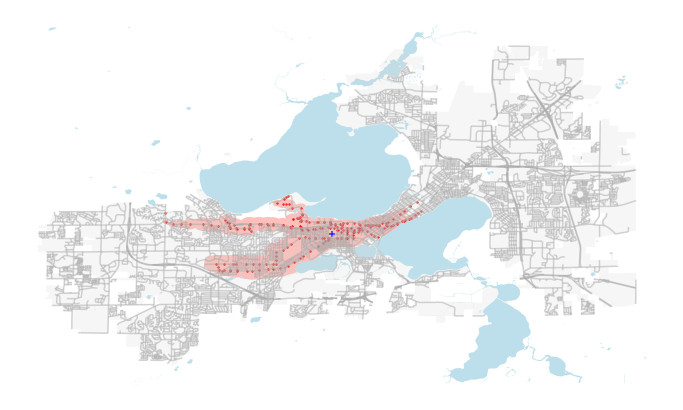

In [17]:
plot("Camp Randall stadium")

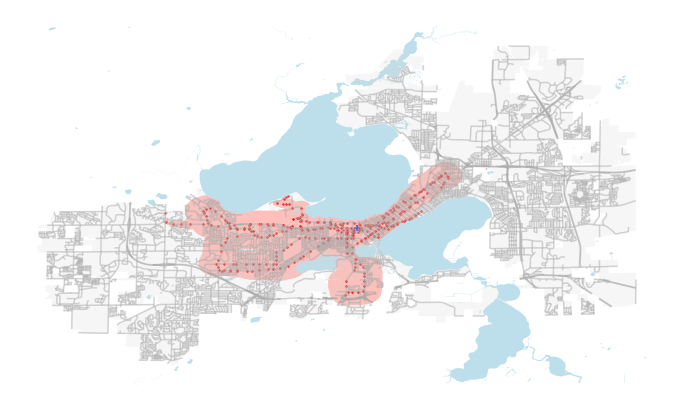

In [18]:
plot("Lucky apartment madison")